## Cleaning up data before modeling

- drops columns with over 50 missing predictors (none)
- imputes via median value rows w less than 20% missing predictors 
- imputes data via median for rows with Nan/placeholder values
- ensures certain "scientifically specified" predictors are not dropped yet

In [1]:
# =========================================================
# 1️⃣  IMPORTS AND PARAMETERS
# =========================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from pathlib import Path

# --------------------------
# Parameters
# --------------------------
row_nan_threshold = 0.2   # Drop rows with >20% missing predictors
col_nan_threshold = 0.5   # Drop predictors with >50% missing values
impute_strategy = 'median'  # 'median' or 'mean'
placeholder_values = [-9999.000000, -9999.000000, np.inf, -np.inf]  # values to treat as NaN
target_col = 'log_soc_stock'  # target variable
force_keep = ['site_info_id', 'district', 'bio1', 'bio7', 'bio4', 'bio5', 'precip_sum', 'tmax_mean', 'TWI', 'MRVBF', 'terrain_surv_conv', 'terrain_surf_texture', 'normalized_height', 'slope_height', 'lithology','standardized_height'
]

input_path = "/Users/inesschwartz/Desktop/train_covariates_1km.csv"
output_path = "/Users/inesschwartz/Desktop/intermediate_dataset.csv"

In [2]:
# =========================================================
# 2️⃣  LOAD AND INITIAL CLEANUP
# =========================================================
df = pd.read_csv(input_path)
df.replace(placeholder_values, np.nan, inplace=True)

print(f"✅ Loaded {df.shape[0]} rows and {df.shape[1]} columns")

# =========================================================
# 3️⃣  DROP EXCESSIVELY MISSING COLUMNS
# =========================================================
predictor_cols = df.select_dtypes(include='number').columns.drop(target_col)
missing_pct_cols = df[predictor_cols].isna().mean()
cols_to_keep = missing_pct_cols[missing_pct_cols <= col_nan_threshold].index

# force keep important predictors
cols_to_keep = cols_to_keep.union([c for c in force_keep if c in df.columns])

cols_dropped = [c for c in predictor_cols if c not in cols_to_keep]

print(f"\nDropped {len(cols_dropped)} columns (> {col_nan_threshold*100:.0f}% missing):")
print(cols_dropped)

df_cleaned = df[[target_col] + list(cols_to_keep)].copy()

✅ Loaded 920 rows and 71 columns

Dropped 0 columns (> 50% missing):
[]


## imputing rows where missing data can be averaged

In [3]:
# =========================================================
# 3️⃣  CLEAN DUPLICATE COLUMNS & REPLACE PLACEHOLDER VALUES WITH NaN
# =========================================================

# 1️⃣ Remove duplicate column names
if df_cleaned.columns.duplicated().any():
    n_dupes = df_cleaned.columns.duplicated().sum()
    df_cleaned = df_cleaned.loc[:, ~df_cleaned.columns.duplicated()].copy()
    print(f"⚠️ Removed {n_dupes} duplicate column(s) from df_cleaned")

# 2️⃣ Keep only valid predictor columns that exist
predictor_cols_cleaned = [c for c in cols_to_keep if c in df_cleaned.columns]

# 3️⃣ Replace all placeholder values (defined in parameters) with NaN — SAFE column-by-column version
n_invalid = 0
for col in predictor_cols_cleaned:
    # Count invalid entries per column
    n_col = df_cleaned[col].isin(placeholder_values).sum()
    n_invalid += n_col
    # Replace all placeholder values with NaN
    df_cleaned.loc[df_cleaned[col].isin(placeholder_values), col] = np.nan

print(f"\n✅ Replaced {n_invalid:,} placeholder values ({placeholder_values}) with NaN for imputation consistency.")



✅ Replaced 0 placeholder values ([-9999.0, -9999.0, inf, -inf]) with NaN for imputation consistency.


In [4]:
print(df_cleaned[predictor_cols_cleaned].isna().sum().sort_values(ascending=False).head(10))


tmin                                          3
tmax                                          3
precip_sum                                    1
DEM                                           0
min_curve                                     0
rangeland_avg1940_1960_percent_1km.tif_pct    0
profile_curve                                 0
plan_curve                                    0
pasture_avg1940_1960_percent_1km.tif_pct      0
normalized_height                             0
dtype: int64


In [5]:
# Columns you want to check for missing values
cols_to_check = ["tmin", "tmax", "precip_sum"]

for col in cols_to_check:
    null_rows = df_cleaned[df_cleaned[col].isna()]

    print(f"\n=== {col.upper()} NULL ROWS ===")
    print(f"Total nulls: {null_rows.shape[0]}")
    
    if null_rows.empty:
        print("No null values found.")
    else:
        # Print site_info_id and the column value (should be NaN)
        print(null_rows[["site_info_id", col]])



=== TMIN NULL ROWS ===
Total nulls: 3
     site_info_id  tmin
54           56.0   NaN
111        2767.0   NaN
132          30.0   NaN

=== TMAX NULL ROWS ===
Total nulls: 3
     site_info_id  tmax
54           56.0   NaN
111        2767.0   NaN
132          30.0   NaN

=== PRECIP_SUM NULL ROWS ===
Total nulls: 1
     site_info_id  precip_sum
132          30.0         NaN


In [6]:
# Fix missing tmax for specific site_info_id values
df_cleaned.loc[df_cleaned['site_info_id'] == 2767.0, 'tmax'] = 29.0
df_cleaned.loc[df_cleaned['site_info_id'] == 30.0,  'tmax'] = 28.0
df_cleaned.loc[df_cleaned['site_info_id'] == 56.0,  'tmax'] = 28.0

df_cleaned.loc[df_cleaned['site_info_id'] == 2767.0, 'tmin'] = 13.0
df_cleaned.loc[df_cleaned['site_info_id'] == 30.0,  'tmin'] = 21.0
df_cleaned.loc[df_cleaned['site_info_id'] == 56.0,  'tmin'] = 21.0

df_cleaned.loc[df_cleaned['site_info_id'] == 30.0,  'precip_sum'] = 1180



In [7]:

# =========================================================
# 4️⃣  DROP ROWS WITH TOO MANY NaNs
# =========================================================
max_missing_per_row = int(row_nan_threshold * len(predictor_cols_cleaned))
rows_missing_count = df_cleaned[predictor_cols_cleaned].isna().sum(axis=1)
rows_to_keep = rows_missing_count <= max_missing_per_row
rows_dropped_count = (~rows_to_keep).sum()

df_cleaned = df_cleaned[rows_to_keep].copy()

print(f"\nDropped {rows_dropped_count} rows with > {row_nan_threshold*100:.0f}% missing predictors")


Dropped 0 rows with > 20% missing predictors


In [8]:

# # =========================================================
# # 5️⃣  IMPUTE REMAINING MISSING VALUES
# # =========================================================
# from sklearn.impute import SimpleImputer

# imputer = SimpleImputer(strategy=impute_strategy)

# n_missing_before = df_cleaned[predictor_cols_cleaned].isna().sum().sum()
# df_cleaned[predictor_cols_cleaned] = imputer.fit_transform(df_cleaned[predictor_cols_cleaned])
# n_missing_after = df_cleaned[predictor_cols_cleaned].isna().sum().sum()

# print(f"\n✅ Imputed {n_missing_before - n_missing_after} missing values using '{impute_strategy}' strategy")

# # Sanity check
# print("\nNaN check after imputation:")
# print(df_cleaned[['annual_mean_temp', 'temp_annual_range']].isna().sum())

# # =========================================================
# # 6️⃣  SAVE CLEANED DATASET
# # =========================================================
# df_cleaned.to_csv(output_path, index=False)
# print(f"\n💾 Cleaned dataset saved to: {output_path}")


In [9]:
df_cleaned.head()

,log_soc_stock,DEM,MRRTF,MRVBF,TWI,Unnamed: 0,X_coord,Y_coord,aspect,aspect_cos,...,terrain_surf_texture,terrain_surv_conv,tmax,tmin,tot_irri_avg1940_1960_percent_1km.tif_pct,tot_rainfed_avg1940_1960_percent_1km.tif_pct,tot_rice_avg1940_1960_percent_1km.tif_pct,total_curve,valley_depth,year
0,1.42,1755.21250,6.989276,8.797771,21.341305,0.0,637881.888723,8.608926e+06,5.557785,0.995014,...,57.979782,53.331062,25.697432,12.332118,0.0,5.450137,0.0,2.765357e-10,55.68104,1956.0
1,1.76,249.64803,0.146695,2.756282,22.467995,1.0,385725.693290,8.669325e+06,4.530129,0.996819,...,55.510345,41.455555,28.102966,18.680190,0.0,4.969031,0.0,9.681931e-11,1358.03220,1958.0
2,0.84,211.95984,4.881122,8.947900,20.841879,2.0,248538.636350,9.488118e+06,1.728716,0.999531,...,50.811890,36.647163,28.179690,20.888538,0.0,1.279943,0.0,1.293843e-10,838.22815,1959.0
3,1.17,1153.72030,7.381047,8.736946,25.538675,3.0,840008.131292,8.731220e+06,4.330614,0.997083,...,47.377380,39.968040,27.373848,13.723731,0.0,0.194317,0.0,8.022119e-11,373.96548,1963.0
4,1.48,273.46014,1.804412,2.708125,20.926138,4.0,384135.495798,8.666721e+06,5.833956,0.994800,...,54.313670,42.682457,28.085814,18.693819,0.0,3.274993,0.0,1.478281e-10,1334.45870,1958.0


In [10]:
# =========================================================
# 7️  DEFINE WORKING DATAFRAMES FOR ANALYSIS
# =========================================================
df1 = df_cleaned.copy()        # main working dataset
df1.describe()    # numeric summary

,log_soc_stock,DEM,MRRTF,MRVBF,TWI,Unnamed: 0,X_coord,Y_coord,aspect,aspect_cos,...,terrain_surf_texture,terrain_surv_conv,tmax,tmin,tot_irri_avg1940_1960_percent_1km.tif_pct,tot_rainfed_avg1940_1960_percent_1km.tif_pct,tot_rice_avg1940_1960_percent_1km.tif_pct,total_curve,valley_depth,year
count,920.000000,920.000000,920.000000,920.000000,920.000000,920.000000,9.200000e+02,9.200000e+02,920.000000,920.000000,...,920.000000,920.000000,920.000000,920.000000,920.000000,920.000000,920.000000,9.200000e+02,920.000000,920.000000
mean,1.386065,974.333528,5.069545,7.131204,21.399180,459.500000,6.014546e+05,8.807645e+06,3.275084,0.997834,...,46.918857,45.456861,27.831857,15.724740,0.039713,2.870915,0.018287,2.400502e-10,470.876892,1960.359783
std,0.514474,522.210587,2.580435,2.732990,1.792181,265.725422,2.781119e+05,3.568248e+05,1.682994,0.001669,...,14.861930,5.993151,1.746443,3.108099,0.466934,3.268226,0.299427,6.797611e-10,360.527008,3.429361
min,0.000000,6.415637,0.009219,0.004945,16.886818,0.000000,1.745446e+05,7.998325e+06,0.121379,0.993993,...,0.000000,25.983961,21.983528,10.226844,0.000000,0.000000,0.000000,1.738455e-13,0.000000,1946.000000
25%,1.050000,620.964187,3.121772,5.630455,20.296122,229.750000,3.835769e+05,8.550657e+06,1.717076,0.996433,...,41.582870,41.336580,26.525695,13.046109,0.000000,0.670636,0.000000,2.228936e-11,186.124770,1957.000000
50%,1.390000,1057.561900,5.883297,8.718323,20.941266,459.500000,5.846140e+05,8.755010e+06,3.472754,0.998128,...,50.256530,46.008602,27.966805,14.964341,0.000000,1.706192,0.000000,6.464655e-11,352.511095,1960.000000
75%,1.690000,1342.172850,6.986198,8.833377,22.052422,689.250000,7.423495e+05,9.097465e+06,4.751750,0.999443,...,57.180312,49.521501,29.060779,18.152126,0.000000,3.732454,0.000000,1.704459e-10,728.259693,1963.000000
max,3.730000,2155.528600,8.813602,8.977631,31.252851,919.000000,1.482544e+06,9.508187e+06,6.283186,0.999998,...,73.296380,65.536200,31.700073,22.087767,7.246944,19.477316,6.594705,9.945471e-09,1549.264300,1967.000000


In [11]:
print("\n✅ Data ready for analysis. Shape:", df1.shape)


✅ Data ready for analysis. Shape: (920, 70)


In [12]:
## outliers, 0s, nans

import pandas as pd
import numpy as np

# Select numeric columns
numeric_cols = df1.select_dtypes(include=[np.number]).columns

# Initialize results dictionary
summary = {}

for col in numeric_cols:
    data = df[col]
    
    # Count NaNs
    n_nan = data.isna().sum()
    
    # Count zeros
    n_zero = (data == 0).sum()
    
    # Detect outliers using 1.5*IQR rule
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    n_outliers = ((data < lower_bound) | (data > upper_bound)).sum()
    
    # Store results
    summary[col] = {
        "NaN_count": n_nan,
        "Zero_count": n_zero,
        "Outlier_count": n_outliers
    }

# Convert results to a DataFrame for easy viewing
summary_df = pd.DataFrame(summary).T  # transpose for readability
summary_df = summary_df.sort_values(by="Outlier_count", ascending=False)

# Display results
summary_df

,NaN_count,Zero_count,Outlier_count
ecoforms,0,3,257
lithology,0,0,166
flow_accumulation,0,0,157
bio14,0,773,147
landsurface_forms,0,0,122
...,...,...,...
grazing_avg1940_1960_percent_1km.tif_pct,0,6,0
DEM,0,0,0
bio6,0,0,0
bio7,0,0,0


In [13]:
# how to deal w outliers?
##outliers

import numpy as np
import pandas as pd

summary = {}

for col in df.select_dtypes(include=[np.number]).columns:
    data = df[col]

    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    summary[col] = {
        "min": data.min(),
        "max": data.max(),
        "mean": data.mean(),
        "n_outliers_iqr": ((data < lower) | (data > upper)).sum(),
        "lower_bound": lower,
        "upper_bound": upper
    }

outlier_summary = pd.DataFrame(summary).T
print(outlier_summary.sort_values("n_outliers_iqr", ascending=False))


                            min           max          mean  n_outliers_iqr  \
ecoforms           0.000000e+00  2.550000e+02  8.959565e+01           257.0   
lithology          1.000000e+00  2.550000e+02  6.558696e+00           166.0   
flow_accumulation  1.011001e+06  5.814976e+10  4.019374e+08           157.0   
bio14              0.000000e+00  5.000000e+00  2.668495e-01           147.0   
landsurface_forms  1.000000e+00  7.000000e+00  2.083696e+00           122.0   
...                         ...           ...           ...             ...   
bio18              3.300000e+01  6.190000e+02  3.612320e+02             0.0   
MRRTF              9.218778e-03  8.813602e+00  5.069545e+00             0.0   
site_info_id       1.000000e+00  4.006000e+03  1.535688e+03             0.0   
aspect_sin         2.118460e-03  1.094426e-01  5.710007e-02             0.0   
ridge_level        5.936231e+02  2.193242e+03  1.444908e+03             0.0   

                    lower_bound   upper_bound  
eco

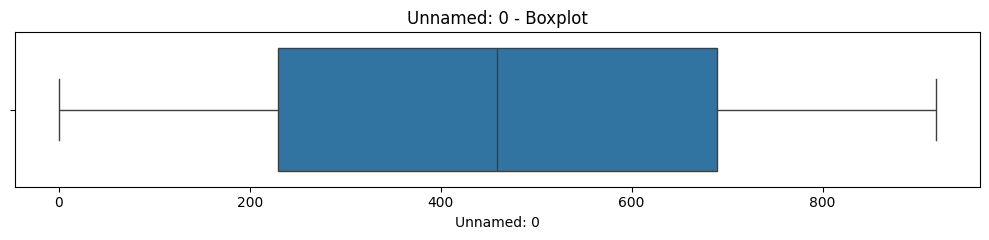

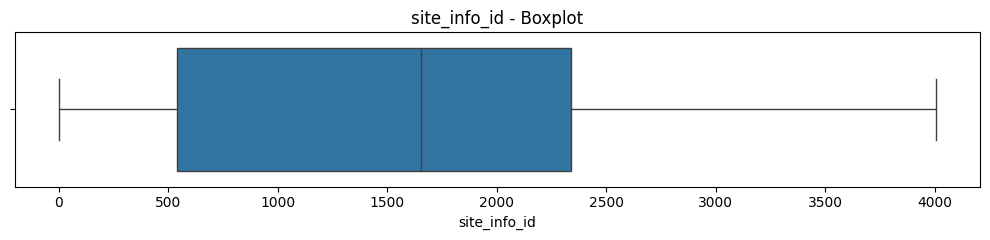

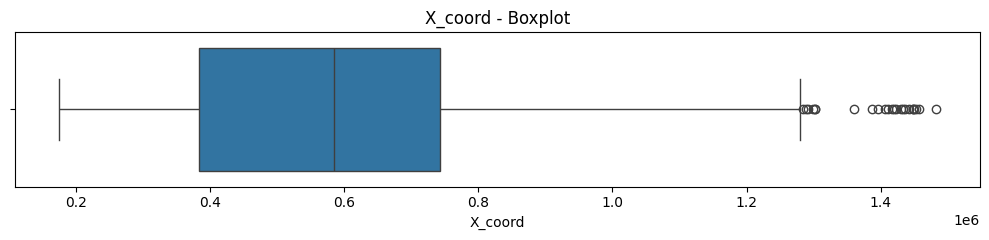

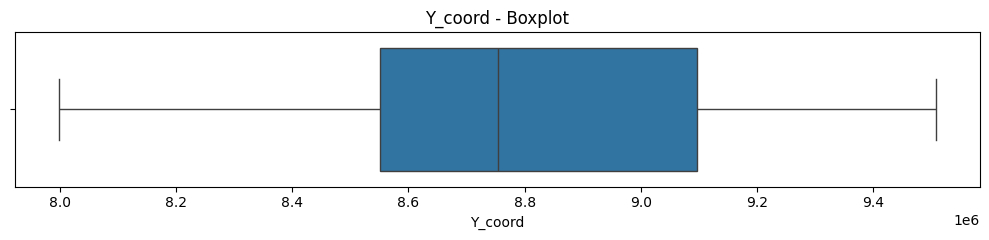

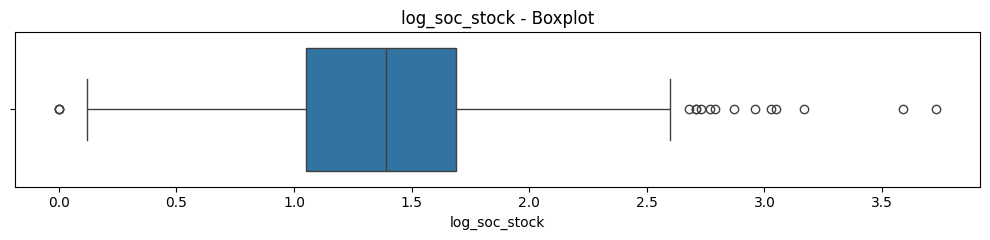

...

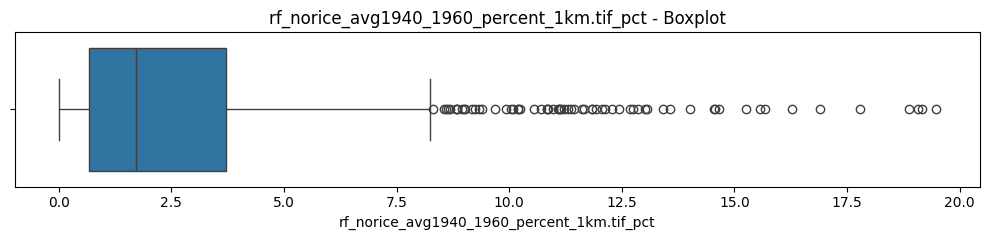

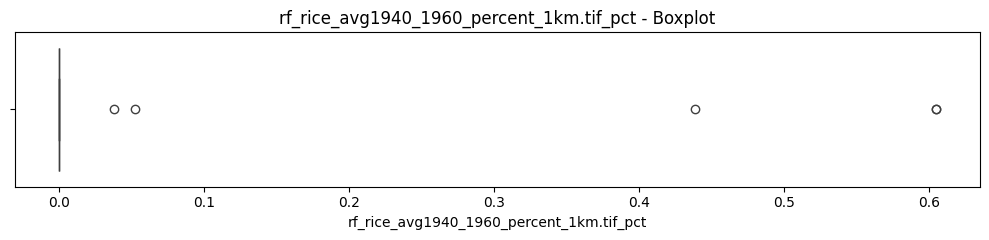

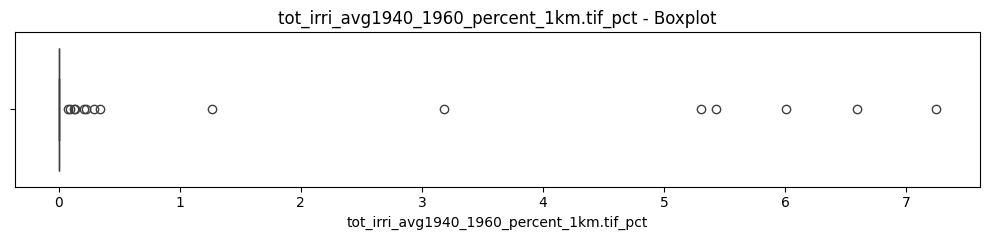

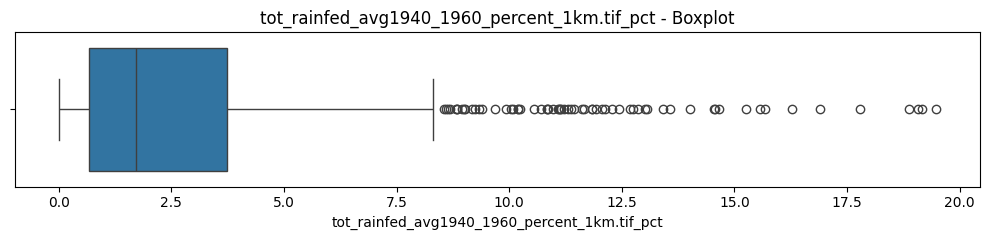

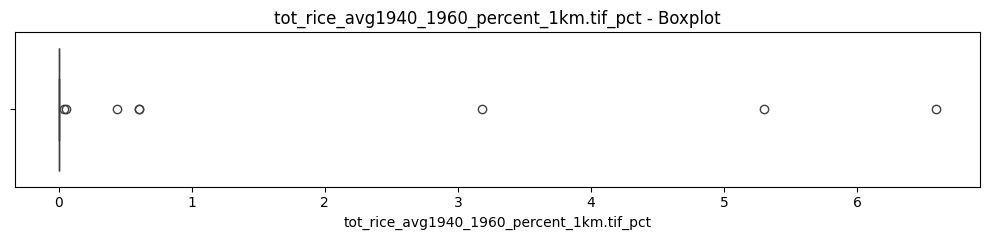

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Select only numeric columns
numeric_cols = df.select_dtypes(include=[np.number]).columns

for col in numeric_cols:
    plt.figure(figsize=(10, 2.5))
    sns.boxplot(x=df[col])
    plt.title(f'{col} - Boxplot')
    plt.tight_layout()
    plt.show()


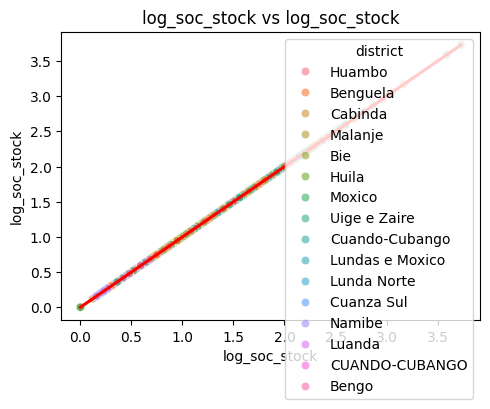

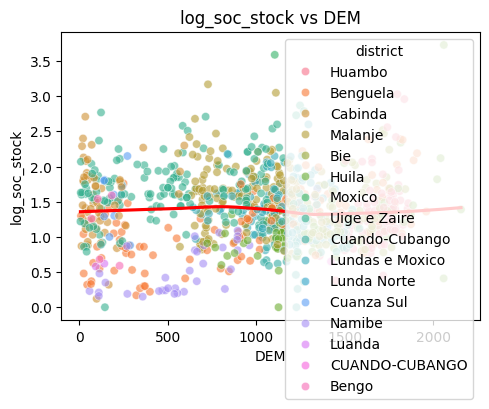

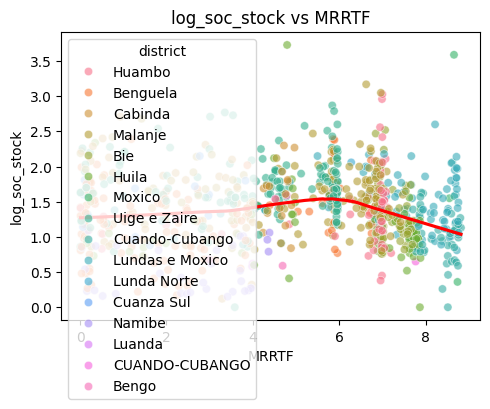

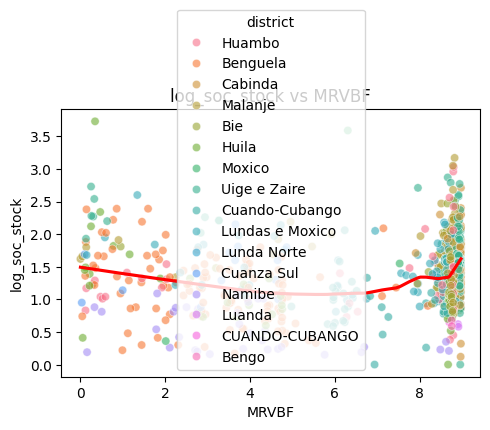

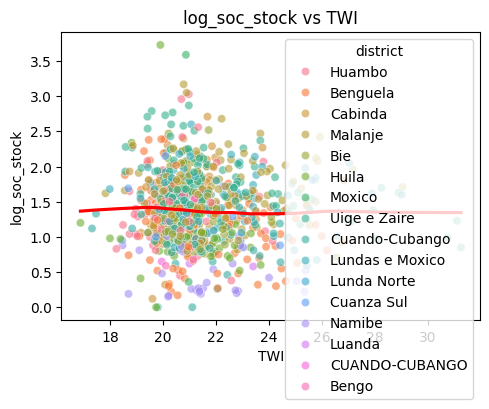

...

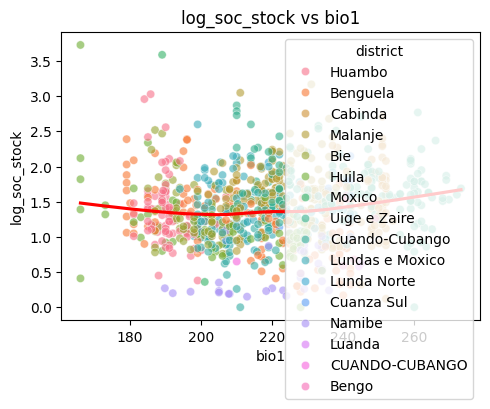

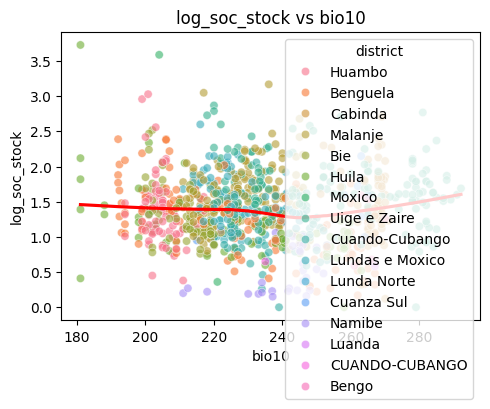

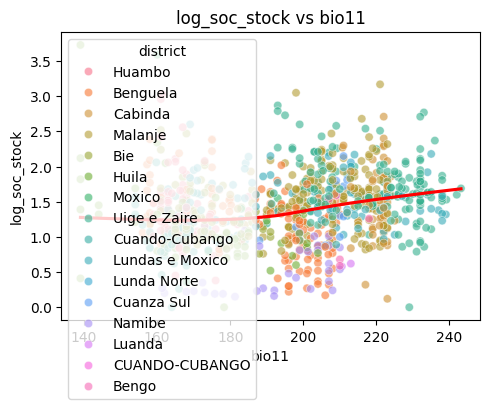

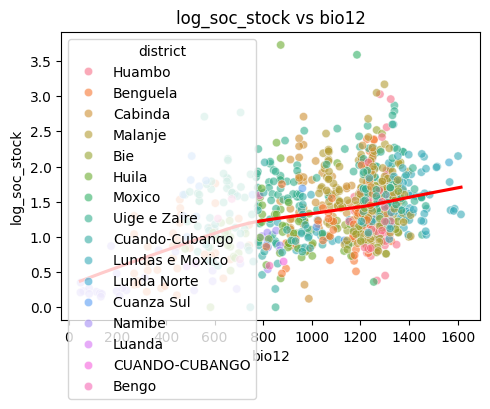

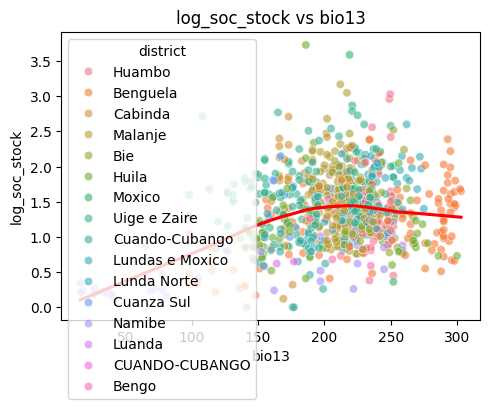

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


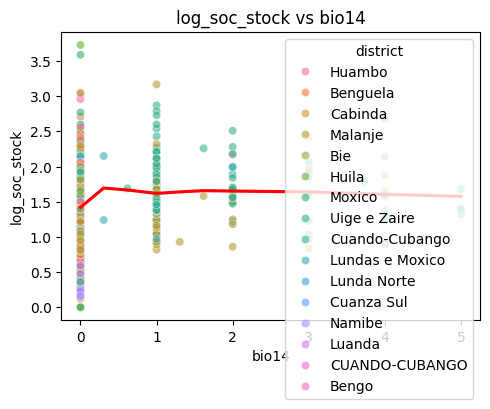

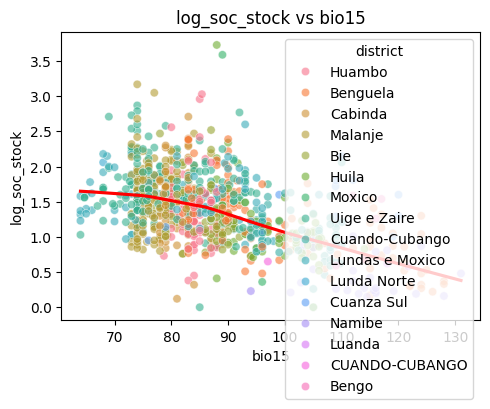

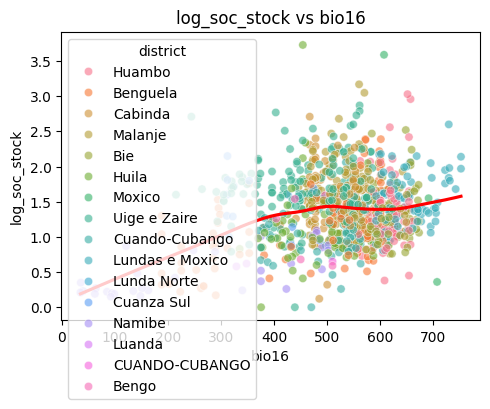

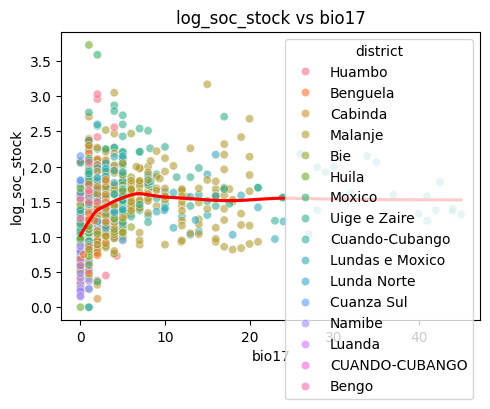

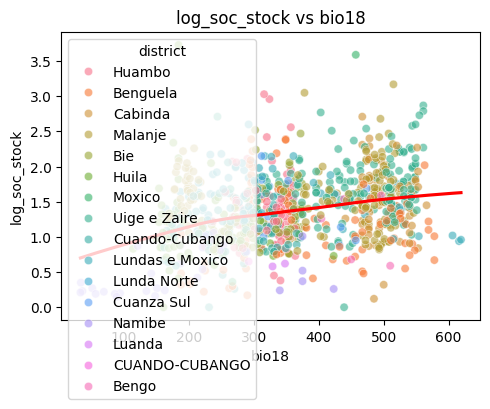

...

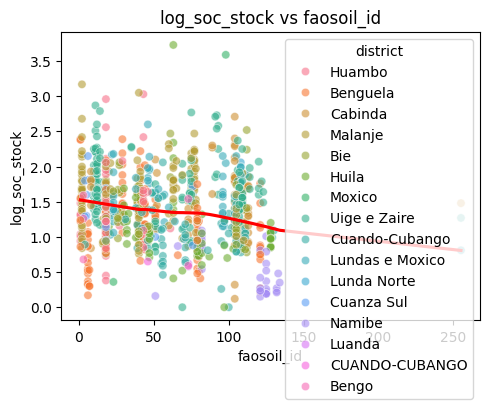

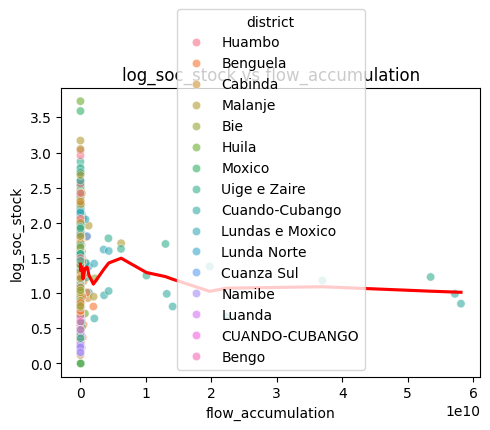

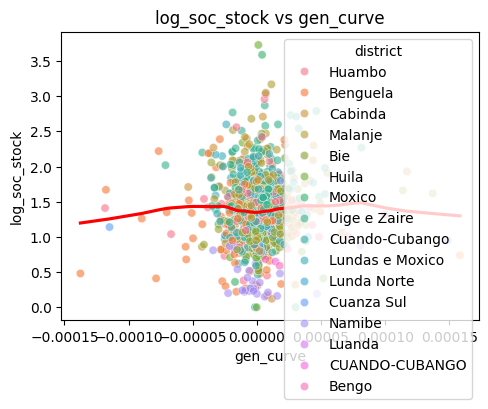

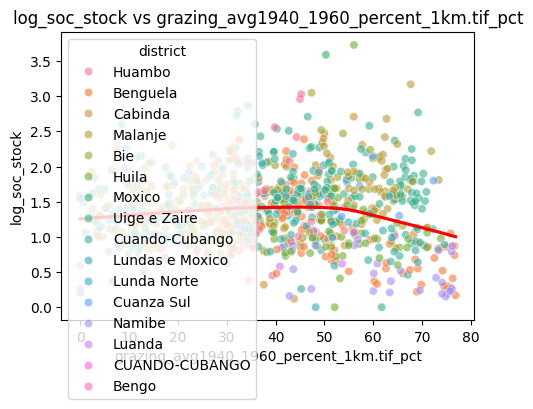

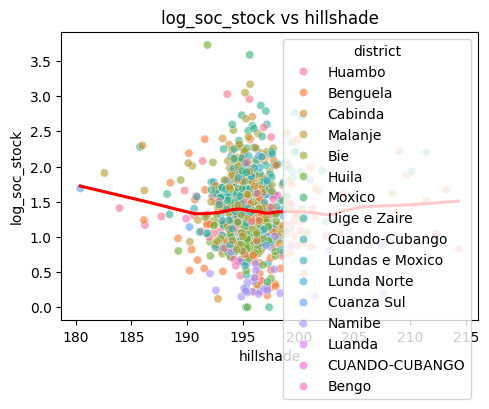

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


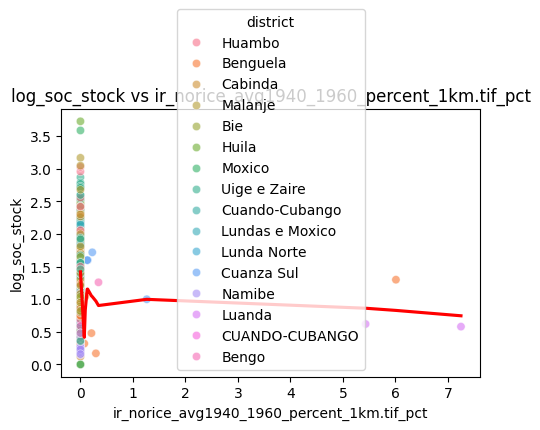

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


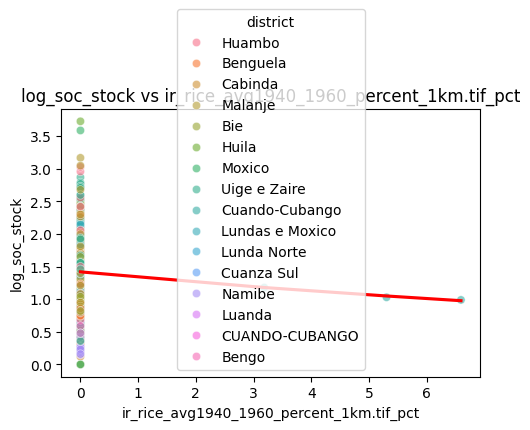

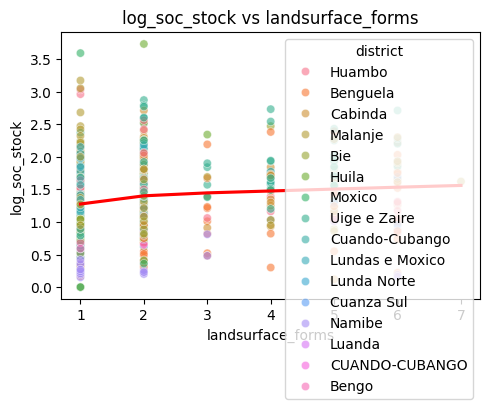

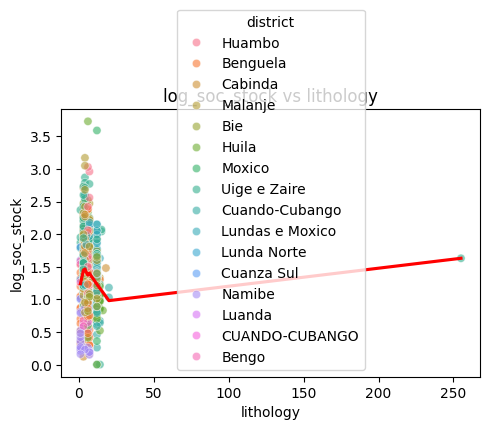

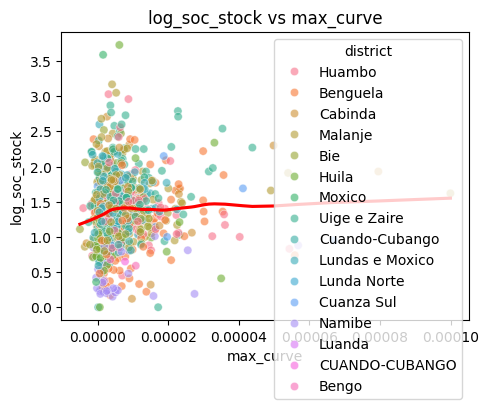

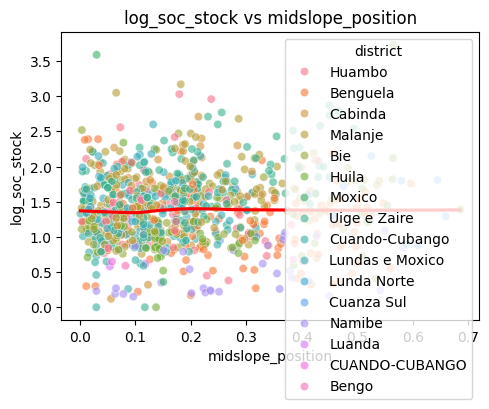

...

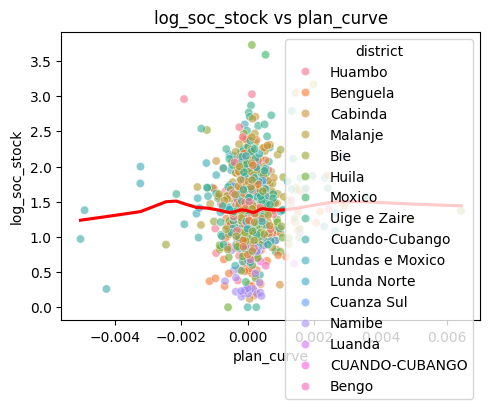

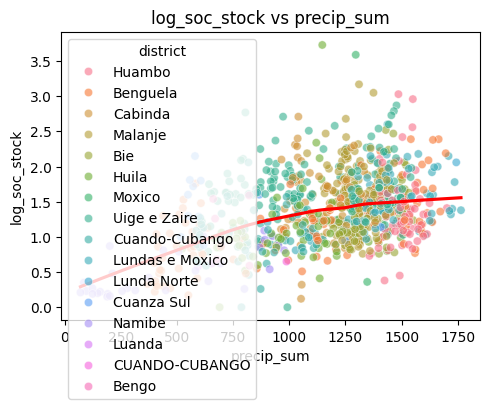

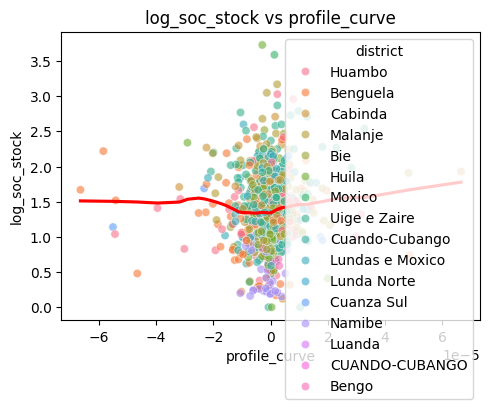

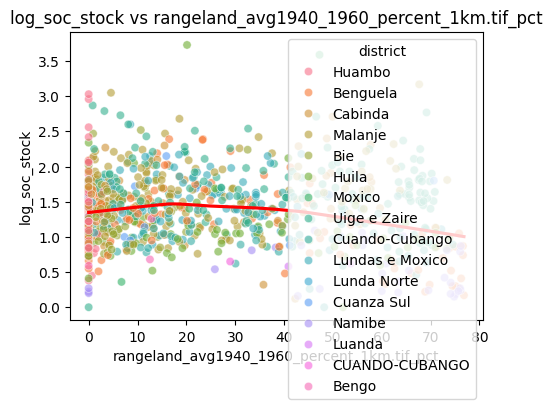

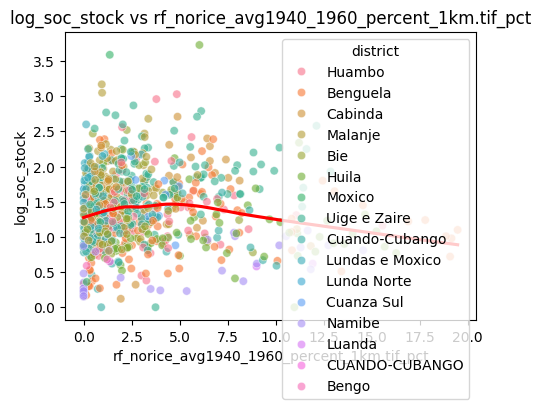

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


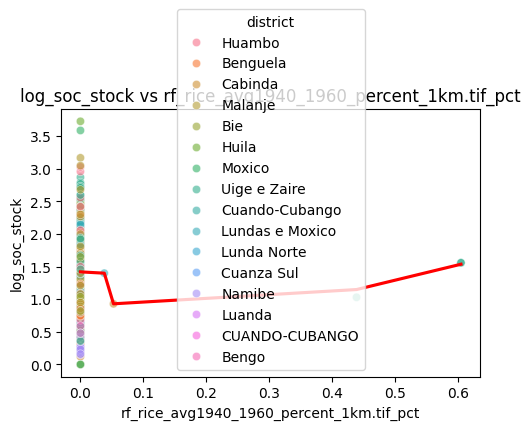

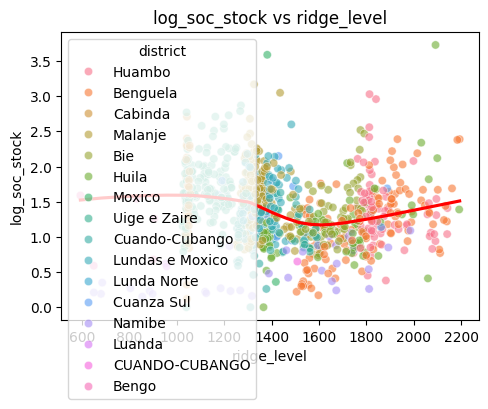

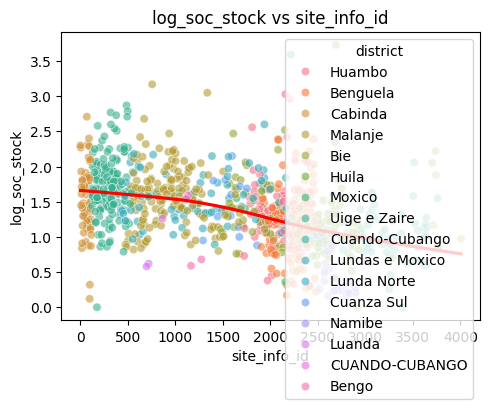

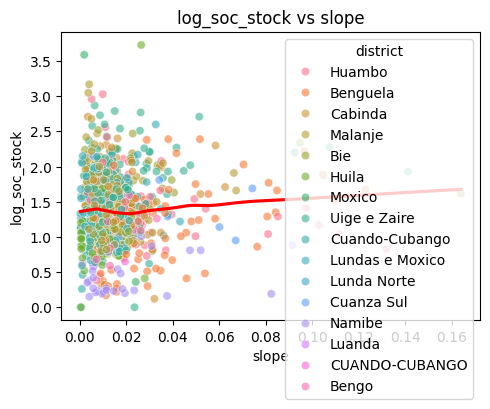

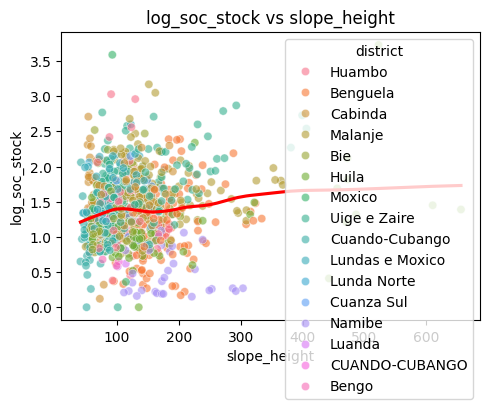

...

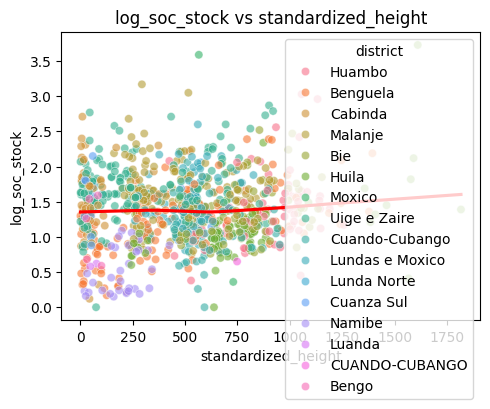

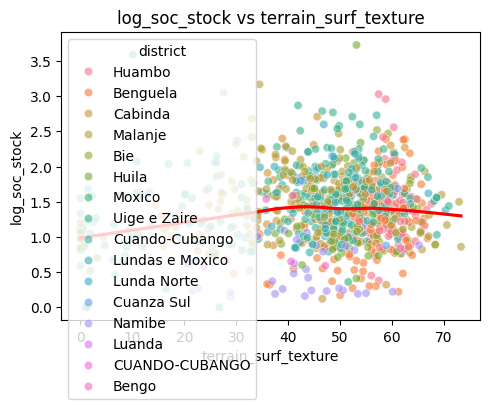

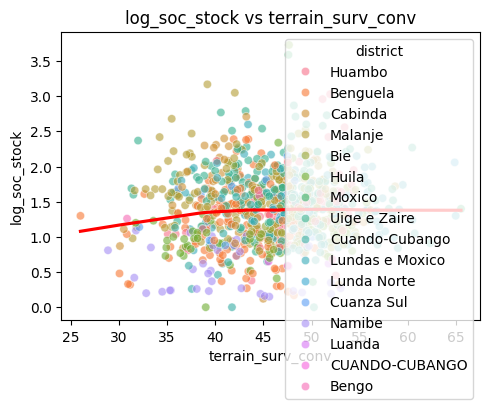

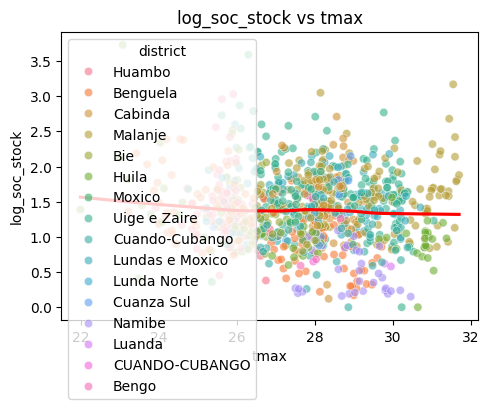

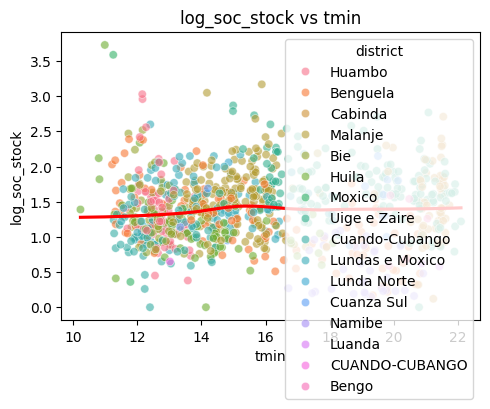

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


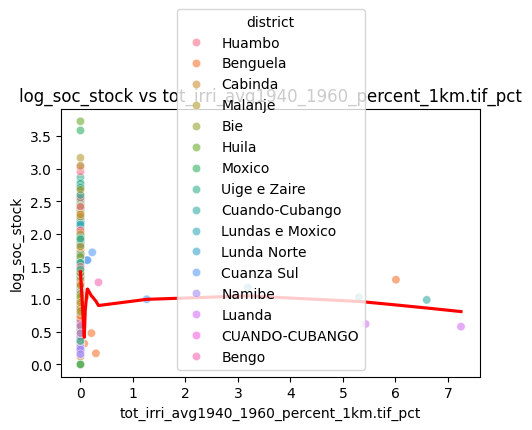

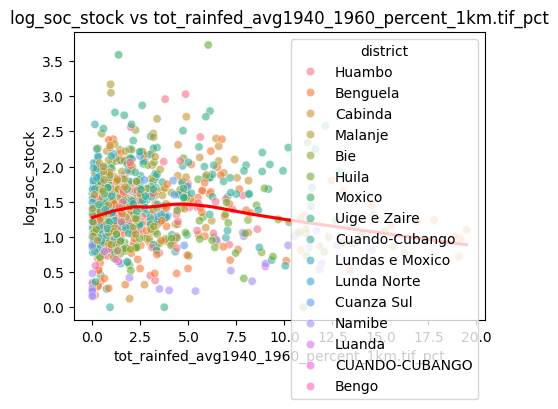

/opt/homebrew/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


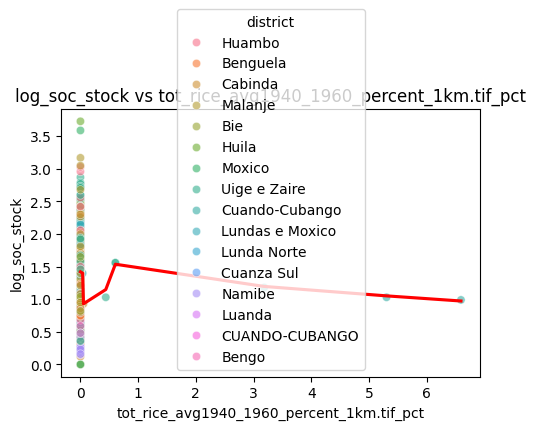

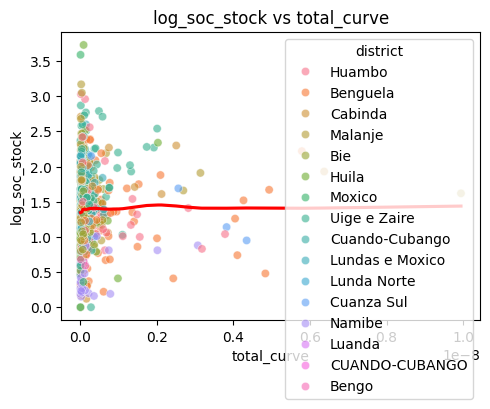

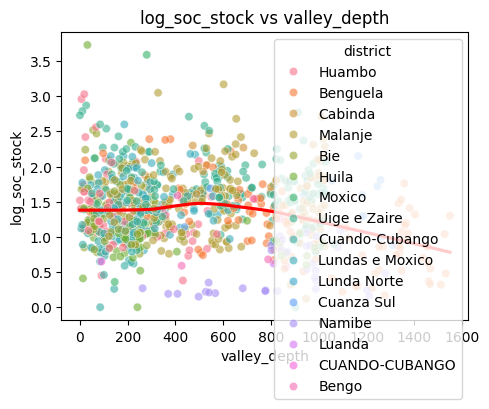

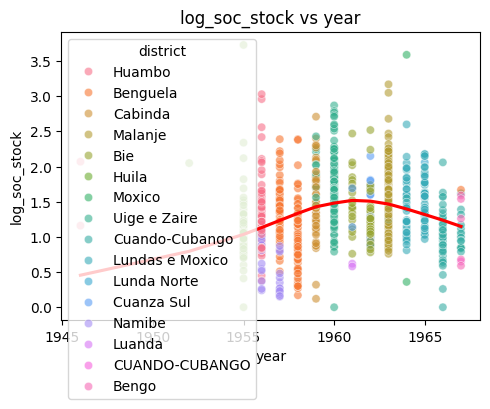

In [16]:
# Select numeric columns
numeric_cols = df1.select_dtypes(include=[np.number]).columns


# Check which numeric columns exist in df1
numeric_cols_existing = [col for col in numeric_cols if col in df1.columns]

# Create scatter plots vs log_soc_stock
for col in numeric_cols_existing:
    plt.figure(figsize=(5,4))
    sns.scatterplot(data=df1, x=col, y='log_soc_stock', alpha=0.6, hue='district')
    # Optional trend line (smoothed)
    sns.regplot(data=df1, x=col, y='log_soc_stock', scatter=False, lowess=True, color='red' )
    
    plt.title(f"log_soc_stock vs {col}")
    plt.xlabel(col)
    plt.ylabel("log_soc_stock")
    plt.tight_layout()
    plt.show()
    plt.close()

In [17]:
# =========================================================
# 10  CORRELATION AND REDUNDANCY CHECK
# =========================================================
df_reduced = df1.copy()
corr_matrix = df_reduced.corr(numeric_only=True).abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
high_corr = [column for column in upper.columns if any(upper[column] > 0.9)]

print(f"\nHighly correlated columns (>0.9): {high_corr}")

# Keep FAO/literature important ones regardless
keep_cols = ['site_info_id', 'district', 'bio1', 'bio7', 'bio4', 'bio5', 'precip_sum', 'tmax_mean', 'TWI', 'MRVBF', 'terrain_surv_conv', 'terrain_surf_texture', 'normalized_height', 'slope_height', 'lithology','standardized_height']
high_corr = [c for c in high_corr if c not in keep_cols]

df_reduced = df_reduced.drop(columns=high_corr, errors='ignore')

print(f"\nDropped {len(high_corr)} redundant columns after correlation filtering.")


Highly correlated columns (>0.9): ['aspect_cos', 'aspect_sin', 'bio1', 'bio10', 'bio11', 'bio16', 'bio7', 'bio8', 'bio9', 'precip_sum', 'rf_norice_avg1940_1960_percent_1km.tif_pct', 'site_info_id', 'standardized_height', 'tmin', 'tot_rainfed_avg1940_1960_percent_1km.tif_pct', 'tot_rice_avg1940_1960_percent_1km.tif_pct']

Dropped 11 redundant columns after correlation filtering.


In [18]:
df_reduced.isna().sum().sort_values(ascending=False)


log_soc_stock                                 0
rf_rice_avg1940_1960_percent_1km.tif_pct      0
ir_rice_avg1940_1960_percent_1km.tif_pct      0
landsurface_forms                             0
lithology                                     0
max_curve                                     0
midslope_position                             0
min_curve                                     0
normalized_height                             0
pasture_avg1940_1960_percent_1km.tif_pct      0
plan_curve                                    0
precip_sum                                    0
profile_curve                                 0
rangeland_avg1940_1960_percent_1km.tif_pct    0
ridge_level                                   0
hillshade                                     0
site_info_id                                  0
slope                                         0
slope_height                                  0
slope_length                                  0
soc_stock_0_30cm                        

In [19]:
# =========================================================
# 11️  MULTICOLLINEARITY (VIF)
# =========================================================
continuous_cols = [c for c in df1.select_dtypes(include=[np.number]).columns 
                   if c not in [target_col, 'X_coord', 'Y_coord', 'site_info_id']]

X = df1[continuous_cols].dropna()
vif_df = pd.DataFrame({
    "variable": X.columns,
    "VIF": [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
}).sort_values("VIF", ascending=False)

print("\n📊 Variance Inflation Factors (VIF):")
print(vif_df)


📊 Variance Inflation Factors (VIF):
                                      variable           VIF
27   cropland_avg1940_1960_percent_1km.tif_pct  1.385723e+14
24                                        bio7  1.385723e+14
47  rf_norice_avg1940_1960_percent_1km.tif_pct  1.344358e+14
23                                        bio6  1.268620e+14
34  ir_norice_avg1940_1960_percent_1km.tif_pct  1.072286e+14
..                                         ...           ...
30                           flow_accumulation  1.591378e+00
52                                slope_length  1.575987e+00
53                            soc_stock_0_30cm  1.385836e+00
4                                   Unnamed: 0  1.382668e+00
37                                   lithology  1.193709e+00

[65 rows x 2 columns]


In [20]:
df_reduced.columns

Index(['log_soc_stock', 'DEM', 'MRRTF', 'MRVBF', 'TWI', 'Unnamed: 0',
       'X_coord', 'Y_coord', 'aspect', 'bio1', 'bio12', 'bio13', 'bio14',
       'bio15', 'bio17', 'bio18', 'bio19', 'bio2', 'bio3', 'bio4', 'bio5',
       'bio6', 'bio7', 'cropland_avg1940_1960_percent_1km.tif_pct', 'district',
       'ecoforms', 'faosoil_id', 'flow_accumulation', 'gen_curve',
       'grazing_avg1940_1960_percent_1km.tif_pct', 'hillshade',
       'ir_norice_avg1940_1960_percent_1km.tif_pct',
       'ir_rice_avg1940_1960_percent_1km.tif_pct', 'landsurface_forms',
       'lithology', 'max_curve', 'midslope_position', 'min_curve',
       'normalized_height', 'pasture_avg1940_1960_percent_1km.tif_pct',
       'plan_curve', 'precip_sum', 'profile_curve',
       'rangeland_avg1940_1960_percent_1km.tif_pct',
       'rf_rice_avg1940_1960_percent_1km.tif_pct', 'ridge_level',
       'site_info_id', 'slope', 'slope_height', 'slope_length',
       'soc_stock_0_30cm', 'standardized_height', 'terrain_surf_texture

In [28]:
## Drop rice-related columns and duplicate SOC stock column (not needed)

rice_columns = [
    'ir_norice_avg1940_1960_percent_1km.tif_pct',
    'ir_rice_avg1940_1960_percent_1km.tif_pct',
    'rf_rice_avg1940_1960_percent_1km.tif_pct',
    'rf_rice_avg1940_1960_percent_1km.tif_pct',
    'soc_stock_0_30cm', 'Unnamed: 0', 'tot_irri_avg1940_1960_percent_1km.tif_pct'
]

df_reduced = df_reduced.drop(columns=rice_columns)


KeyError: "['ir_norice_avg1940_1960_percent_1km.tif_pct', 'ir_rice_avg1940_1960_percent_1km.tif_pct', 'rf_rice_avg1940_1960_percent_1km.tif_pct', 'rf_rice_avg1940_1960_percent_1km.tif_pct', 'soc_stock_0_30cm', 'Unnamed: 0', 'tot_irri_avg1940_1960_percent_1km.tif_pct'] not found in axis"

In [29]:
existing_rice_cols = [c for c in rice_columns if c in df_reduced.columns]
print(f"Dropping {len(existing_rice_cols)} rice-related columns: {existing_rice_cols}")

df_reduced = df_reduced.drop(columns=existing_rice_cols)


Dropping 0 rice-related columns: []


In [47]:
## Rename land-use percent columns to simpler names

df_reduced = df_reduced.rename(columns={
    'rangeland_avg1940_1960_percent_1km.tif_pct': 'rangeland',
    'cropland_avg1940_1960_percent_1km.tif_pct': 'cropland',
    'grazing_avg1940_1960_percent_1km.tif_pct': 'grazing',
    'pasture_avg1940_1960_percent_1km.tif_pct': 'pasture'
})

In [48]:
df_reduced.columns

Index(['log_soc_stock', 'DEM', 'MRRTF', 'MRVBF', 'TWI', 'X_coord', 'Y_coord',
       'aspect', 'bio1', 'bio12', 'bio13', 'bio14', 'bio15', 'bio17', 'bio18',
       'bio19', 'bio2', 'bio3', 'bio4', 'bio5', 'bio6', 'bio7', 'cropland',
       'district', 'ecoforms', 'faosoil_id', 'flow_accumulation', 'gen_curve',
       'grazing', 'hillshade', 'landsurface_forms', 'lithology', 'max_curve',
       'midslope_position', 'min_curve', 'normalized_height', 'pasture',
       'plan_curve', 'precip_sum', 'profile_curve', 'rangeland', 'ridge_level',
       'site_info_id', 'slope', 'slope_height', 'slope_length',
       'standardized_height', 'terrain_surf_texture', 'terrain_surv_conv',
       'tmax', 'total_curve', 'valley_depth', 'year'],
      dtype='object')

In [41]:
df_reduced.shape

(920, 53)

In [49]:
# =========================================================
# 13️  FINAL EXPORT
# =========================================================
final_path = "/Users/inesschwartz/Desktop/final_training_dataset1.csv"
df_reduced.to_csv(final_path, index=False)
print(f"\n🎯 Ready-to-train dataset saved at: {final_path}")


🎯 Ready-to-train dataset saved at: /Users/inesschwartz/Desktop/final_training_dataset1.csv
